# Dimension Reduction and Images Project

Author: Ephraim Sun - 7000, Jadon Swearingen - 5000, Adeeb Abdul Taher -7000


Our dataset initially had a group of about 3300 computer parts, such as keyboards, mice, wires, ram chips, motherboards, etc. We then removed some in order to clean the dataset to 1183 parts. The purpose of this data is for machines to be able to identify different parts based on a new picture of them. machines that are attempting to build PCs and need to utilize cameras to locate certain parts for removal or insertion This includes, for example, correctly identifying a keyboard versus a RAM chip, so that it does not choose the wrong item or damage any components.

Another use for our classifier is to sort scrap components from actual usable parts when recycling computers, as well as to remove any toxic parts from going to the landfill. For example, before trash goes into a land fill a camera would scan for certain parts.


The dataset comprises images of various PC parts, totaling around 1183 pictures, which are categorized into 9 distinct classes for classification. 

The primary purpose behind collecting this dataset is to facilitate the quick and efficient identification of PC components. Each image corresponds to a specific part, and the prediction task involves accurately classifying these images into their respective categories.

Several third parties would be interested in the results derived from this dataset. Computer hardware retailers, manufacturers, and scrap recycling are primary examples.
Some components may be sharp or explosive or toxic in scrap and might hurt handlers, so can be taken care of and warned with our algorithm.

Given that the algorithm serves as a preliminary stage tool and does not involve high-stakes decisions, a moderate level of accuracy is acceptable. Achieving an accuracy of around 75% would suffice for the intended purpose. While higher accuracy is desirable, the for the purpose of PCA analysis, this would be able to get the point through. 

Dataset: https://www.kaggle.com/datasets/asaniczka/pc-parts-images-dataset-classification

## Using PCA with sklearn
Let's use PCA to find the two "best" dimensions of this data
These are linear transforms to help project the features into something more understandable

In [110]:
import seaborn as sns
from sklearn.decomposition import PCA

from matplotlib.pyplot import scatter


## Explained Variance
Recall that the explained variance is a factor of the eigen values. We can access these via the following equation:

$$ r_q=\frac{\sum_{j=1}^q \lambda_j}{\sum_{\forall i} \lambda_i} $$

# PCA With Image Data
This is code manipulated from Olivier Grisel's eigen face classification demonstration. You can find the original notebook here: http://nbviewer.ipython.org/github/ogrisel/notebooks/blob/master/Labeled%20Faces%20in%20the%20Wild%20recognition.ipynb

In [111]:
import os
import cv2
import numpy as np


# Define your data directory containing subfolders (class labels)
data_dir = './pc_parts'

# Initialize lists to store data and labels
image_data = []
labels = []

# Traverse subfolders
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        for img_file in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_file)
            img = cv2.imread(img_path)
            imgg = cv2.resize(img, (128, 128))
            gray_image = cv2.cvtColor(imgg, cv2.COLOR_BGR2GRAY)
            image_data.append(np.ravel(gray_image))
            labels.append(class_name)

# Convert lists to NumPy arrays
X = np.array(image_data)
y = np.array(labels)
names=list(set(labels))
label = {item:i + 1 for i, item in enumerate(names)}


# Print shapes for verification
print("x_train shape:", X.shape)  # (num_images, height, width, channels)
print("y_train shape:", y.shape)  # (num_images,)



x_train shape: (1183, 16384)
y_train shape: (1183,)


Up above, we are resizing and recoloring the necessary images.

Specifically,

```
img = cv2.imread(img_path)
imgg = cv2.resize(img, (128, 128))
```

Then, we are linearizing the images to create a table of 1-D image features (each row should be one image).

Specifically, we are using Ravel to linearize it

```
image_data.append(np.ravel(gray_image))
```


In [112]:
n_samples, n_features = X.shape
n_classes = len(names)

h,w=128,128
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print(f"Original Image Sizes {h} by {w}")

n_samples: 1183
n_features: 16384
n_classes: 8
Original Image Sizes 128 by 128


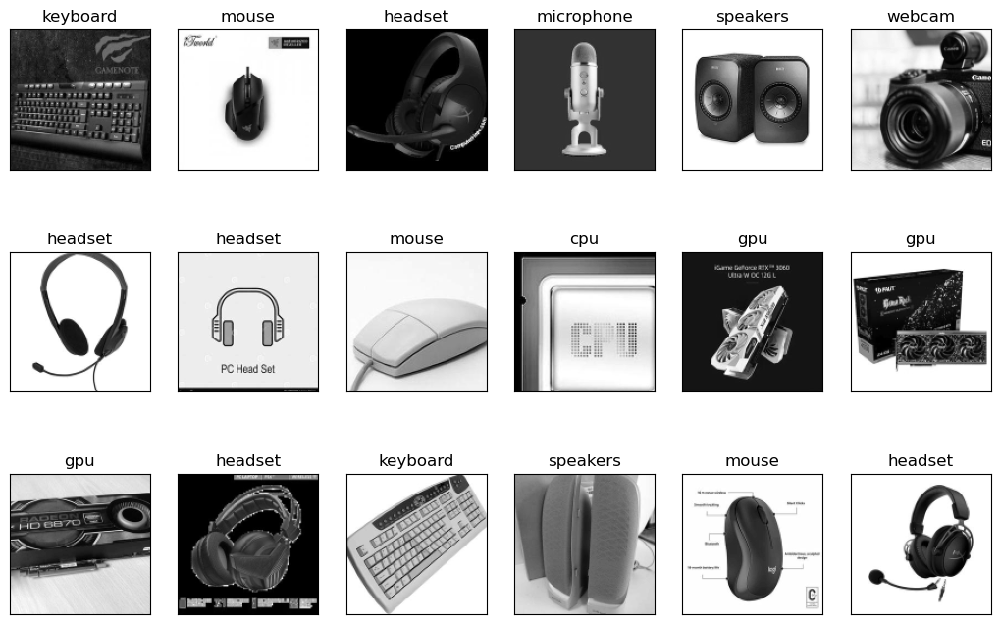

In [113]:
# a helper plotting function
from matplotlib import pyplot as plt
import random
randomlist= random.sample(range(0, 1182), 18)


def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[randomlist[i]].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[randomlist[i]], size=12)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X, y, h, w) # defaults to showing a 3 by 6 subset of the faces

Up above, we are visualizing several images.

## Reconstruct Using Full PCA


In [141]:
# lets do some PCA of the features and go from 1850 features to 20 features
from sklearn.decomposition import PCA


n_components = 500
randomlist=range(0,18)
print ("Extracting the top %d eigenfaces from %d photos" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenfaces = pca.components_.reshape((n_components, h, w))

Extracting the top 500 eigenfaces from 1183 photos
CPU times: total: 19.8 s
Wall time: 5.24 s


In [115]:
# manipulated from Sebastian Raschka Example (your book!)
# also from hi blog here: http://sebastianraschka.com/Articles/2015_pca_in_3_steps.html

# this is a scree plot
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
plot_explained_variance(pca)

###  Perform linear dimensionality reduction of your image data using principle components analysis.
This has been visualised in the above example,

Total time taken for this was ```19.8 seconds```

Randomized PCA needs ```17 components``` for capturing 75% of the variance

```31 components``` for 80%

```123``` for 90%



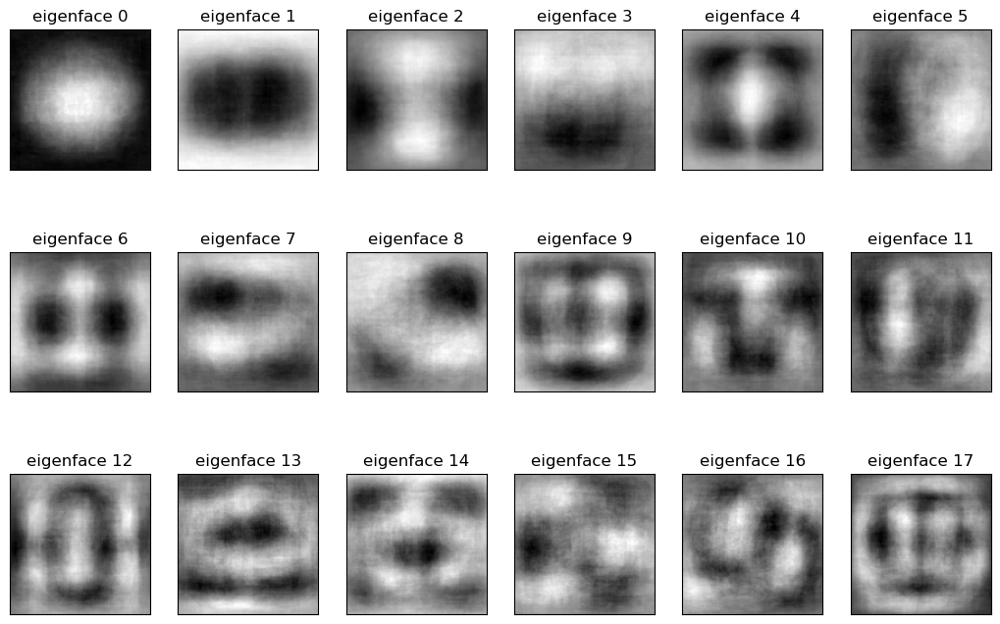

In [137]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w)

In [117]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

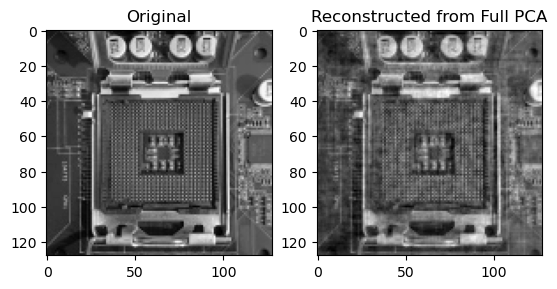

In [118]:
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

## Now Let's Use Randomized PCA
Of course, the methods that are used to calculate eigenvectors (the components) do not scale well with the number of features (in this case, the image dimensions). Recall that PCA works on the covariance matrix and the covariance matrix size is not affected by the number of examples, only the number of features. Randomized PCA helps to mitigate this by formulating the eigenvectors of a lower rank matrix using randomized projections. 

More information here: 
- http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
- ftp://ftp.math.ucla.edu/pub/camreport/cam08-60.pdf
- Halko, et al., 2009 (arXiv:909) A randomized algorithm for the decomposition of matrices Per-Gunnar Martinsson, Vladimir Rokhlin and Mark Tygert

In [140]:
# lets do some PCA of the features and go from 1850 features to 300 features

n_components = 500
print ("Extracting the top %d eigenimages from %d photos" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenimages = rpca.components_.reshape((n_components, h, w))
plot_explained_variance(rpca)

Extracting the top 500 eigenimages from 1183 photos
CPU times: total: 17.8 s
Wall time: 5.19 s


###  Perform linear dimensionality reduction of your image data using randomized principle components analysis.
This has been visualised in the above example,

Total time taken for this was ```16.7 seconds```

Randomized PCA needs ```17 components``` for capturing 75% of the variance

```31 components``` for 80%

```123``` for 90%

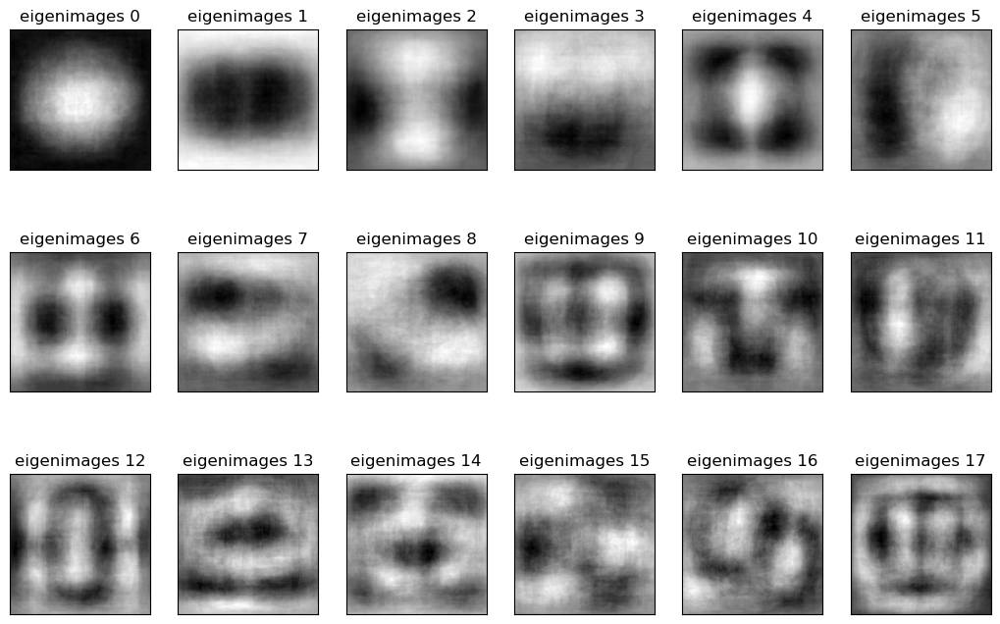

In [120]:
eigenimage_titles = ["eigenimages %d" % i for i in range(eigenimages.shape[0])]
plot_gallery(eigenimages, eigenimage_titles, h, w)

In [143]:
import warnings
from ipywidgets import widgets  # make this interactive!
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)



def plt_reconstruct(idx_to_reconstruct):
    # this code is for reference only, it does not qualify as a neaarest neighbor search
    #  for your lab project. 
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(y[idx_to_reconstruct]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(1,3,2) # pca
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(1,3,3) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)
    plt.show()
    
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=591, description='idx_to_reconstruct', max=1182), Output()), _dom_classe…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

### Comparing PCA and Randomized PCA

From the above 2 observation we can safely say that PCA is better than PCA at accuracy and for obtaining the components of highest variance among the datapoints in the dataset. 

However, we need to also note the time taken by both approaches. PCA has ```19.8``` and randomized PCA is ```16.7 ``` . This dataset only had about a 1000 images of 128*128 resolution which comes down to about 16000 features. But in the real world, there could be 1000 times more images and way higher resolution, so the PCA has its advantages where a slight decrease on accuracy can reward with a much significant time efficiency.

We came to the conclusion that we would prefer PCA. As the machines are getting overly powerful, compute time is almost never a constraint. Even with the Global Interpreter Lock in Python.

## PCA For Image Classification

In [123]:
from ipywidgets import fixed
import copy

from sklearn.metrics.pairwise import pairwise_distances
#find the pairwise distance between all the different image features
X_pca_features = rpca.transform(copy.deepcopy(X))
dist_matrix_pca = pairwise_distances(copy.deepcopy(X_pca_features),
                                     metric="seuclidean")


#put it together inside a nice widget
def closest_image(dmat_pca, idx1):

#NOTE: this will NOT suffice for evaluation of a nearest neighbor classifier for your lab assignment
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image distances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances) #pca

    distances[idx2] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances) # pixels

    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(X[idx1].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Original:"+y[idx1])
    plt.grid(False)

    plt.subplot(1,3,2)
    plt.imshow(X[idx2].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Closest:"+y[idx2])
    plt.grid(False)

    plt.subplot(1,3,3)
    plt.imshow(X[idx3].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Next Closest:"+y[idx3])
    plt.grid(False)
    plt.show()

widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=591, description='idx1', max=1182), Output()), _dom_classes=('widget-int…

<function __main__.closest_image(dmat_pca, idx1)>

____
# Image Processing Crash Course
Now let's look at other Methods for extracting features from images.

Let's start by calculating gradients:

c:\Users\jadon\anaconda3\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:162: UserWarning:

The figure layout has changed to tight



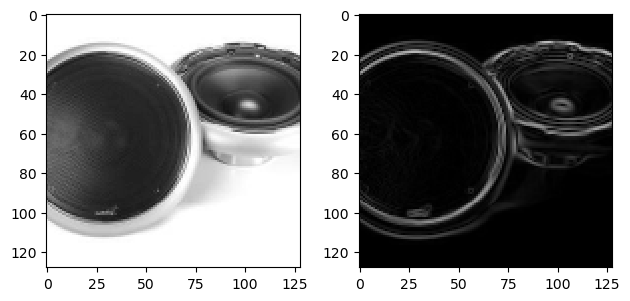

In [124]:
from skimage.io import imshow
from skimage.filters import sobel_h, sobel_v

plt.subplot(1,2,1)
idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid(False)


plt.subplot(1,2,2)
gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid(False)
plt.show()

## Image Feature: DAISY Bag of Features Model
As discussed in lecture, DAISY Features are a means of looking at histograms of edges weights using gradients at various orientations (if you are new to this, that is not a satisfying explanation, please look back at the notes/slides for the course.). 

http://scikit-image.org/docs/dev/_images/sphx_glr_plot_daisy_001.png

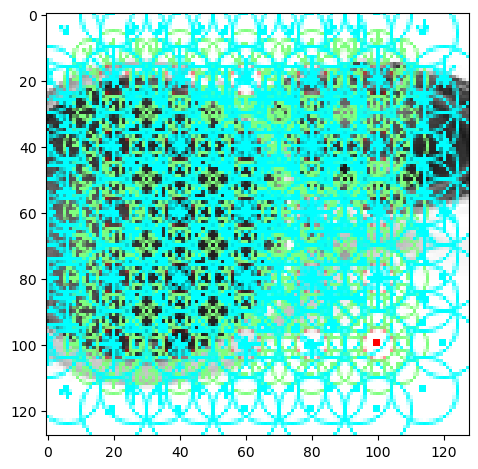

In [125]:
from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img, 
                           step=20, 
                           radius=20, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
imshow(img_desc)
plt.grid(False)
plt.show()

### The above snippet shows Daisy feature extraction.

In [126]:
# now let's understand how to use it
features = daisy(img, step=10, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(9, 9, 68)
5508


In [127]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=10, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: total: 0 ns
Wall time: 20.2 ms


(5508,)

In [128]:
0.026 * len(X) # approximate how long it may run

30.758

In [129]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: total: 17.9 s
Wall time: 18.7 s
(1183, 5508)


In [130]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time
dist_matrix = pairwise_distances(daisy_features)

CPU times: total: 0 ns
Wall time: 0 ns


c:\Users\jadon\anaconda3\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:162: UserWarning:

The figure layout has changed to tight



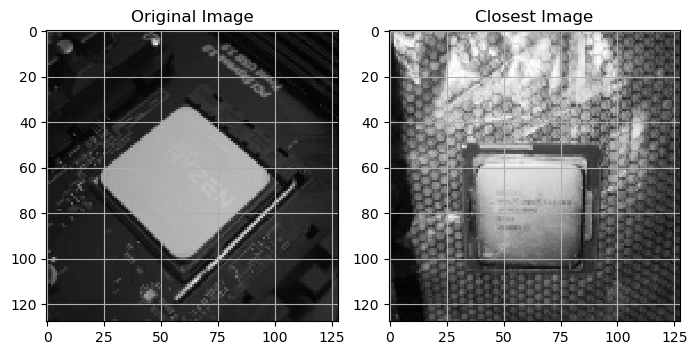

In [131]:
import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [132]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat_daisy, dmat_pca, idx1):
    # NOTE: this will not suffice for evaluation 
    # of a nearest neighbor classifier for your lab assignment
    # do not use this code for satifying the lab assignment requirement
    
    distances = copy.deepcopy(dmat_daisy[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original: "+y[idx1])
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("DAISY Closest: "+y[idx2])
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("PCA Closest: "+y[idx3])
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_daisy=fixed(dist_matrix),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=591, description='idx1', max=1182), Output()), _dom_classes=('widget-int…

<function __main__.closest_image(dmat_daisy, dmat_pca, idx1)>

In [133]:
pca_obj = PCA(n_components=300)
X_pca_features = pca_obj.fit_transform(X)

### Performing Feature Extraction

Sadly, neither dimensionality nor feature extractions show promise for the task we had undertaken. 
We attribute these to several factors, but most prominent are:
> Colour also plays an important role in classifying images.

> Daisy can only improve the outcome of a classifier up to an extent.

We see that images that are predominantly white, are grouped closest to other images that are predominantly white. Rather than extracting features as such, the Classifier was comparing white spaces.

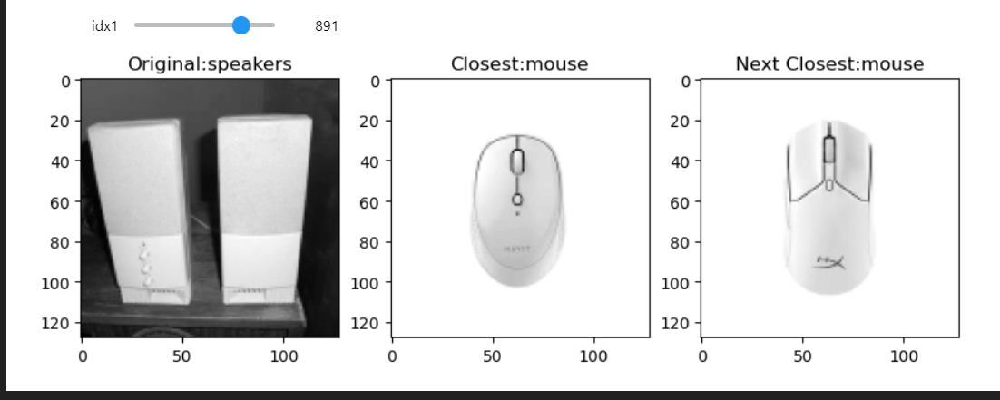

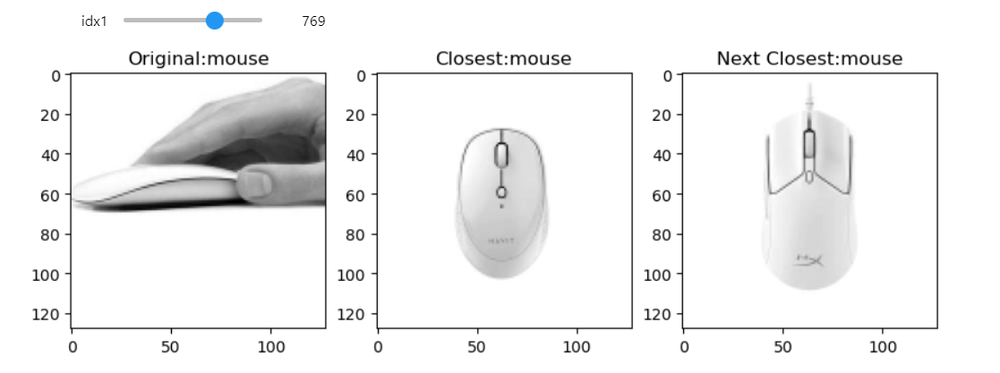

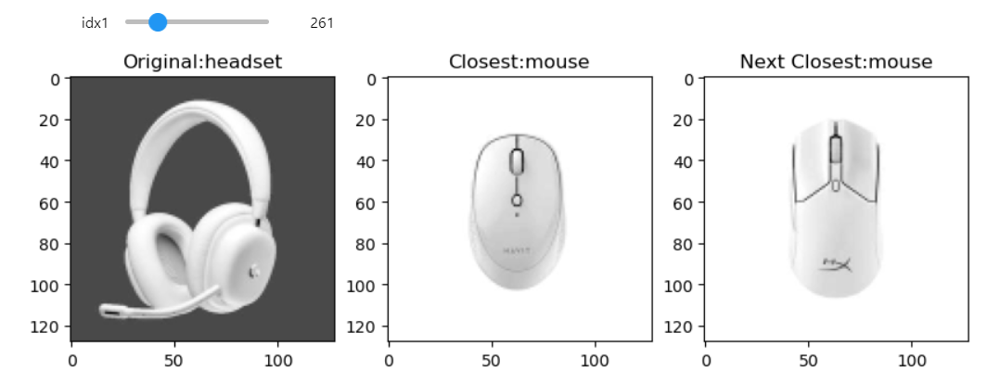



Although Daisy is faster and uses computationally more advanced concepts, it does not fully meet our requirements for a good classifier. It can help classification models to get better and faster but there is a limit to what it can do. After that limit, it is upon the classification model to properly use the features extracted.

“Dimensionality Reduction plays a really important role in machine learning, especially when you are working with thousands of features. Principal Components Analysis is one of the top dimensionality reduction algorithms, it is not hard to understand and use it in real projects. This technique, in addition to making the work of feature manipulation easier, still helps to improve the results of the classifier” from Dimensionality Reduction — Does PCA really improve classification outcome? | by Meigarom | Towards Data Science (https://towardsdatascience.com/dimensionality-reduction-does-pca-really-improve-classification-outcome-6e9ba21f0a32)



In the beginning, we had the following results:

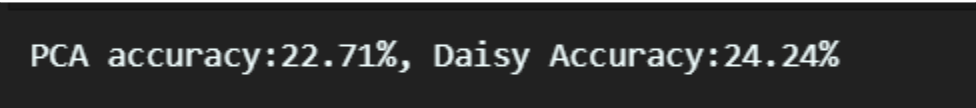

Then we tried to clean our data and removes all inconsistencies and wrongly placed images and labels we were able to increase it to:

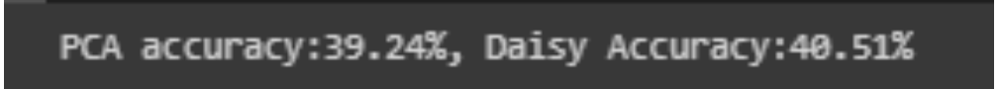

Then we edited aur code a bit more so that the classifier can take in relevant information and reached these results:

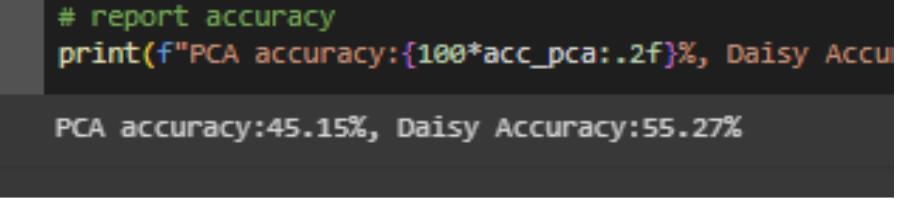


We observed the following trends for PCA:

| % of variance to be encompassed | Before cleaning | After Cleaning | After reducing resolution | 
| ----------- | ----------- | ----------- | ----------- |
| 75 | 26 | 22 | 17 |
| 80 | 51 | 41 | 31 |
| 90 | 264 | 179 | 123 |




It is important to note that these scores change on each run, so the values shown are a rough average of the real values encountered.


## Bonus: K-Nearest Neighbor Classification with each Feature Space

You can skip this if you want, it's only for an intuition about how it works
Let's try getting a more quantitative measure of performance by using a sklearn classifier for each feature space.

In [161]:
 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# init a classifier for each feature space
knn_pca = KNeighborsClassifier(n_neighbors=1)
knn_dsy = KNeighborsClassifier(n_neighbors=1)

# separate the data into train/test
pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_features,daisy_features, y, test_size=0.2, train_size=0.8)

# fit each classifier
knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

# report accuracy
print(f"PCA accuracy:{100*acc_pca:.2f}%, Daisy Accuracy:{100*acc_dsy:.2f}%".format())

PCA accuracy:39.24%, Daisy Accuracy:48.52%


It is important to note that these scores change on each run, so the values shown are a rough average of the real values encountered.
We built the nearest neighbour classifier, and still the results were not very surprising.. 

### Nevertheless, it is important to be realistic and expect results that are common to such approaches, therefore we tried to compare the example worked in class by the professor.

NN classifier **Professor’s code**:

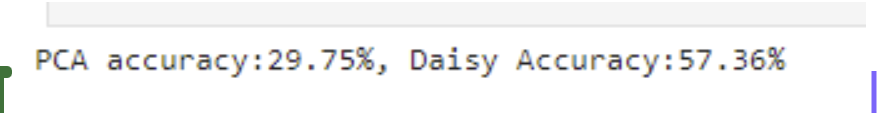

NN classifier **Our code**:

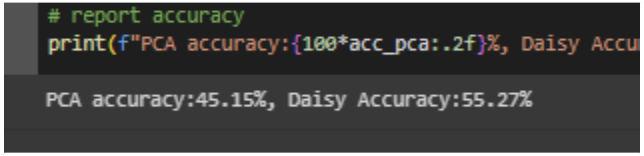



Matching descriptors between pairs of images to assess their similarity or dissimilarity for **Our code**:

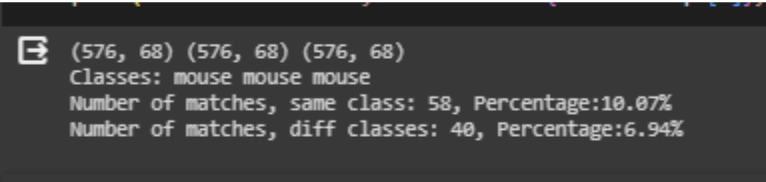

Matching descriptors between pairs of images to assess their similarity or dissimilarity for **Professor's code**:

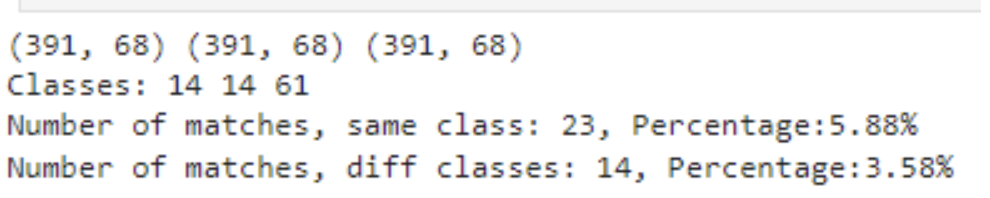


## <mark> Hence, In conclusion, our results show considerable improvement.</mark>


# Exceptional Work

In [135]:
# for the exceptional credit, you might be interested in the following code
# you will need to repeat this for all pairs of images in the testing and training 
from skimage.feature import match_descriptors

def apply_daisy(row,shape): # no reshape in this function
    feat = daisy(row.reshape(shape), step=5, radius=5, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    s = feat.shape # PxQxR
    #P = ceil((Height - radius*2) / step) 
    #Q = ceil((Width - radius*2) / step) 
    #R = (rings * histograms + 1) * orientations
    return feat.reshape((s[0]*s[1],s[2]))

d1 = apply_daisy(X[10],(h,w))
d2 = apply_daisy(X[11],(h,w))
d3 = apply_daisy(X[0],(h,w))

print(d1.shape, d2.shape, d3.shape)
print('Classes:',y[10],y[11],y[0])

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d2, cross_check=True, max_ratio=0.8)
print(f"Number of matches, same class: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d3, cross_check=True, max_ratio=0.8)
print(f"Number of matches, diff classes: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

(576, 68) (576, 68) (576, 68)
Classes: cpu cpu cpu
Number of matches, same class: 20, Percentage:3.47%
Number of matches, diff classes: 18, Percentage:3.12%


key points of first image- 
(< cv2.KeyPoint 0000013F57AAC270>, < cv2.KeyPoint 0000013F046EF960>, < cv2.KeyPoint 0000013F046EE310>, < cv2.KeyPoint 0000013F046EC090>, < cv2.KeyPoint 0000013F046ECB10>)

key points of second image-
(< cv2.KeyPoint 0000013F046EFA50>, < cv2.KeyPoint 0000013F046ECD80>, < cv2.KeyPoint 0000013F046EFC00>, < cv2.KeyPoint 0000013F046EFB70>, < cv2.KeyPoint 0000013F046EFB40>)

overall features that matched by BFMatcher()-
((< cv2.DMatch 0000013F09E31150>, < cv2.DMatch 0000013F09E30AD0>), (< cv2.DMatch 0000013F09E30EF0>, < cv2.DMatch 0000013F09E30B10>), (< cv2.DMatch 0000013F09E31810>, < cv2.DMatch 0000013F09E30D10>), (< cv2.DMatch 0000013F09E30930>, < cv2.DMatch 0000013F09E32490>), (< cv2.DMatch 0000013F09E30A50>, < cv2.DMatch 0000013F09E302D0>))


('good features',
 [[< cv2.DMatch 0000013F09E31150>],
  [< cv2.DMatch 0000013F09E30EF0>],
  [< cv2.DMatch 0000013F09E30930>],
  [< cv2.DMatch 0000013F09E30A50>]])

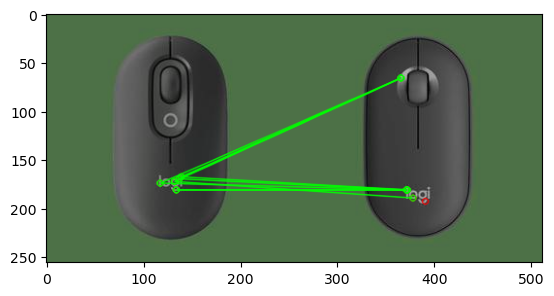

In [136]:
# Importing required modules 
import cv2 
import matplotlib.pyplot as plt 
  
# reading images 
img1 = cv2.imread("./pc_parts/mouse/2.jpg") 
img2 = cv2.imread("./pc_parts/mouse/9.jpg") 
  
# function for feature matching 
def BFMatching(img1, img2): 
    # Initiate SIFT detector 
    feat = cv2.ORB_create(5) 
  
    # find the keypoints and descriptors with SIFT 
    kpnt1, des1 = feat.detectAndCompute(img1, None) 
    kpnt2, des2 = feat.detectAndCompute(img2, None) 
  
    # BFMatcher with default parameters 
    bf = cv2.BFMatcher() 
    # finding matches from BFMatcher() 
    matches = bf.knnMatch(des1, des2, k=2)  
    # Apply ratio test 
    good = [] 
    matched_image = cv2.drawMatchesKnn(img1,  
           kpnt1, img2, kpnt2, matches, None, 
           matchColor=(0, 255, 0), matchesMask=None, 
           singlePointColor=(255, 0, 0), flags=0) 
# creating a criteria for the good matches 
# and appending good matchings in good[] 
    for m, n in matches: 
        # print("m.distance is <",m.distance,">  
        # 1.001*n.distance is <",0.98*n.distance,">") 
        if m.distance < 0.98 * n.distance: 
            good.append([m]) 
# for jupyter notebook use this function 
# to see output image 
    plt.imshow(matched_image) 
  
# if you are using python then run this- 
    # cv2.imshow("matches", matched_image) 
    # cv2.waitKey(0) 
# uncomment the below section if you want to see 
# the key points that are being used by the above program 
    print("key points of first image- ") 
    print(kpnt1) 
    print("\nkey points of second image-") 
    print(kpnt2) 
    print("\noverall features that matched by BFMatcher()-") 
    print(matches) 
    return("good features", good)  # returning ggod features 
  
  
BFMatching(img1, img2) 


The above markdown block describes the task of performing feature extraction on images using the DAISY method. Instead of using matching on the total DAISY vector, the approach involves key point matching. The block mentions the need to investigate appropriate methods for key point matching using DAISY, noting that this process can be computationally expensive due to the requirement of brute force matching per pair of images. The question posed is whether key point matching performs better than not using it. Based on us doing a few different images, sometimes it matches well for similar things, but more often than not regular DAISY method is better. There need to be more optimizations to this code for it to be viable, especially since it takes longer due to this brute force method.
Code from: https://www.geeksforgeeks.org/python-opencv-bfmatcher-function/